In [25]:
# -------- cell 1: imports & config ---------------------------------
from __future__ import annotations
import re, random, csv
from collections import Counter
from pathlib import Path
from dataclasses import dataclass
from typing import List, Tuple
import os

import torch, torch.nn as nn, torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from torch.nn.utils.rnn import pad_sequence, pack_padded_sequence
from nltk.translate.bleu_score import corpus_bleu
import torchvision.transforms as T
import torchvision.models as models
from PIL import Image
import matplotlib.pyplot as plt

try:
    from tqdm.notebook import tqdm  # nicer in Jupyter
except ImportError:
    from tqdm import tqdm           # plain fallback

plt.rcParams["figure.dpi"] = 120

@dataclass
class Config:
    data_root: Path = Path("dataset")
    batch_size: int = 128
    num_epochs: int = 30
    embed_size: int = 512
    hidden_size: int = 512
    num_layers: int = 2
    lr_decoder: float = 1e-3
    lr_cnn: float = 1e-4
    min_word_freq: int = 10
    label_smooth: float = 0.1
    seed: int = 123
    beam_width: int = 15
    checkpoint: Path = Path("checkpoint.pth")

cfg = Config()

# reproducibility
random.seed(cfg.seed)
torch.manual_seed(cfg.seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(cfg.seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")  # e.g. “Using device: cuda” or “Using device: cpu”
TOKEN_RE = re.compile(r"[a-zA-Z0-9']+")

# -------- cell 2: vocabulary & dataset -----------------------------
class Vocabulary:
    PAD, SOS, EOS, UNK = "<pad>", "<sos>", "<eos>", "<unk>"

    def __init__(self, min_freq: int):
        self.min_freq = min_freq
        self.idx2word = [self.PAD, self.SOS, self.EOS, self.UNK]
        self.word2idx = {w: i for i, w in enumerate(self.idx2word)}
        self.counter = Counter()

    def add_sentence(self, s: str):
        self.counter.update(TOKEN_RE.findall(s.lower()))

    def build(self):
        for w, c in self.counter.items():
            if c >= self.min_freq and w not in self.word2idx:
                self.word2idx[w] = len(self.idx2word)
                self.idx2word.append(w)

    def encode(self, s: str) -> List[int]:
        tokens = [self.word2idx.get(t, self.word2idx[self.UNK]) \
                  for t in TOKEN_RE.findall(s.lower())]
        return [self.word2idx[self.SOS]] + tokens + [self.word2idx[self.EOS]]

    def decode(self, idxs: List[int]) -> str:
        ban = {self.word2idx[self.SOS], self.word2idx[self.EOS], self.word2idx[self.PAD]}
        return " ".join(self.idx2word[i] for i in idxs if i not in ban)

    def __len__(self):
        return len(self.idx2word)


class CaptionDataset(Dataset):
    def __init__(self, paths: List[Path], caps: List[str], vocab: Vocabulary, tfm):
        self.paths, self.caps, self.vocab, self.tfm = paths, caps, vocab, tfm

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = self.tfm(Image.open(self.paths[idx]).convert("RGB"))
        cap = torch.tensor(self.vocab.encode(self.caps[idx]), dtype=torch.long)
        return img, cap


def collate(batch, vocab: Vocabulary):
    imgs, seqs = zip(*batch)
    imgs = torch.stack(imgs)
    lens = [len(s) for s in seqs]
    padded = pad_sequence(seqs, batch_first=True,
                         padding_value=vocab.word2idx[vocab.PAD])
    return imgs, padded, torch.tensor(lens)


def make_dataloaders(cfg: Config):
    dr = cfg.data_root; img_dir = dr / "Images"
    raw = dr / "captions.txt"; clean = dr / "captions_clean.csv"
    if clean.exists():
        rows = list(csv.reader(clean.open(encoding="utf-8")))[1:]
        img_paths, captions = zip(*[(img_dir / r[0], r[1]) for r in rows])
    else:
        img_paths, captions, missed = [], [], 0
        with raw.open(encoding="utf-8") as fh:
            rd = csv.reader(fh); next(rd, None)
            for img_file, cap in rd:
                p = img_dir / img_file.strip()
                if p.is_file(): img_paths.append(p); captions.append(cap.strip())
                else: missed += 1
        print(f"Kept {len(img_paths):,} images (dropped {missed:,})")
        with clean.open("w", newline="", encoding="utf-8") as w:
            wr = csv.writer(w); wr.writerow(["image", "caption"])
            for p, c in zip(img_paths, captions): wr.writerow([p.name, c])

    vocab = Vocabulary(cfg.min_word_freq)
    for c in captions: vocab.add_sentence(c)
    vocab.build(); print("Vocab size:", len(vocab))

    tfm = T.Compose([
        T.Resize(256), T.CenterCrop(224), T.ToTensor(),
        T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    ])
    
    ds_full = CaptionDataset(list(img_paths), list(captions), vocab, tfm)
    
    # define train/val/test sizes
    total_len = len(ds_full)
    test_len  = min(50, total_len - 2)             # leave at least 2 for train+val
    rem_len   = total_len - test_len               # what’s left for train+val
    
    # now split the remainder 80% train, 20% val
    train_len = int(0.8 * rem_len)
    val_len   = rem_len - train_len
    
    # reproducible split
    splits = [train_len, val_len, test_len]
    tr_ds, va_ds, te_ds = random_split(
        ds_full,
        splits,
        generator=torch.Generator().manual_seed(cfg.seed)
    )
    
    # create loaders
    tr_dl = DataLoader(tr_ds, cfg.batch_size, shuffle=True,
                       collate_fn=lambda b: collate(b, vocab))
    va_dl = DataLoader(va_ds, cfg.batch_size, shuffle=False,
                       collate_fn=lambda b: collate(b, vocab))
    te_dl = DataLoader(te_ds, cfg.batch_size, shuffle=False,
                       collate_fn=lambda b: collate(b, vocab))
    
    return tr_dl, va_dl, te_dl, vocab

# -------- cell 3: models ----------------------------------
class EncoderCNN(nn.Module):
    def __init__(self, embed_size):
        super().__init__()
        res = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
        self.backbone = nn.Sequential(*list(res.children())[:-1])
        self.fc = nn.Linear(res.fc.in_features, embed_size)
        self.bn = nn.BatchNorm1d(embed_size, 0.01)
        for p in self.backbone.parameters(): p.requires_grad = False

    def forward(self, x):
        x = self.backbone(x).flatten(1)
        return self.bn(self.fc(x))


class DecoderGRU(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers):
        super().__init__()
        self.embed = nn.Embedding(vocab_size, embed_size, padding_idx=0)
        self.gru = nn.GRU(embed_size, hidden_size, num_layers,
                          batch_first=True, dropout=0.3)
        self.fc = nn.Linear(hidden_size, vocab_size)
        self.init_h = nn.Linear(embed_size, hidden_size)
        self.num_layers = num_layers

    def forward(self, feats, caps, lengths):
        emb = self.embed(caps)
        packed = pack_padded_sequence(
            emb, lengths, batch_first=True, enforce_sorted=False)
        h0 = self.init_h(feats).unsqueeze(0).repeat(
            self.num_layers, 1, 1)
        packed_out, _ = self.gru(packed, h0)
        return self.fc(packed_out.data)

    def beam_decode(self, feat, vocab: Vocabulary,
                    max_len=20, beam=5):
        sos = vocab.word2idx[vocab.SOS]
        eos = vocab.word2idx[vocab.EOS]
        unk = vocab.word2idx[vocab.UNK]
        h = self.init_h(feat).unsqueeze(0).repeat(
            self.num_layers, 1, 1)
        seqs = [([sos], 0.0, h)]
        for _ in range(max_len):
            all_c, finished = [], True
            for s, sc, h_t in seqs:
                if s[-1] == eos:
                    all_c.append((s, sc, h_t)); continue
                finished = False
                last = torch.tensor([[s[-1]]], device=feat.device)
                out, h_new = self.gru(self.embed(last), h_t)
                logits = self.fc(out.squeeze(1))
                logits[:, unk] = -float("inf")
                lp, idx = torch.log_softmax(logits, 1).topk(beam, 1)
                for k in range(beam):
                    all_c.append((s + [idx[0, k].item()],
                                  sc - lp[0, k].item(), h_new))
            seqs = sorted(all_c, key=lambda x: x[1])[:beam]
            if finished: break
        best = seqs[0][0]
        if best[0] == sos: best = best[1:]
        if best and best[-1] == eos: best = best[:-1]
        return best

# -------- cell 4: training & evaluation -------------------
class LabelSmoothing(nn.Module):
    def __init__(self, classes: int, smoothing: float,
                 ignore_index: int):
        super().__init__()
        self.conf = 1 - smoothing
        self.smooth = smoothing
        self.cls = classes
        self.ignore = ignore_index

    def forward(self, pred, tgt):
        pred = F.log_softmax(pred, -1)
        true = torch.full_like(pred, self.smooth/(self.cls-1))
        true.scatter_(1, tgt.unsqueeze(1), self.conf)
        mask = tgt != self.ignore
        return -(true * pred).sum(1)[mask].mean()


def make_model(cfg: Config, vocab: Vocabulary) -> Tuple[EncoderCNN, DecoderGRU]:
    enc = EncoderCNN(cfg.embed_size).to(DEVICE)
    dec = DecoderGRU(
        cfg.embed_size, cfg.hidden_size, len(vocab), cfg.num_layers
    ).to(DEVICE)
    return enc, dec


def train_epoch(enc, dec, train_dl, optimizer_enc,
                optimizer_dec, criterion):
    enc.train(); dec.train()
    running_loss = 0.0
    for imgs, caps, lengths in tqdm(train_dl):
        imgs, caps = imgs.to(DEVICE), caps.to(DEVICE)
        # shift for inputs and targets
        inputs = caps[:, :-1]
        targets = caps[:, 1:]
        lengths = [l-1 for l in lengths]
        optimizer_enc.zero_grad(); optimizer_dec.zero_grad()
        feats = enc(imgs)
        outputs = dec(feats, inputs, lengths)
        # pack targets
        packed = pack_padded_sequence(
            targets, lengths, batch_first=True,
            enforce_sorted=False)
        loss = criterion(outputs, packed.data)
        loss.backward()
        optimizer_enc.step(); optimizer_dec.step()
        running_loss += loss.item()
    return running_loss / len(train_dl)


def evaluate(enc, dec, val_dl, criterion, vocab: Vocabulary, cfg: Config):
    enc.eval(); dec.eval()
    val_loss = 0.0
    references, hypotheses = [], []
    with torch.no_grad():
        for imgs, caps, lengths in tqdm(val_dl):
            imgs, caps = imgs.to(DEVICE), caps.to(DEVICE)
            inputs = caps[:, :-1]
            targets = caps[:, 1:]
            lengths = [l-1 for l in lengths]
            feats = enc(imgs)
            outputs = dec(feats, inputs, lengths)
            packed = pack_padded_sequence(
                targets, lengths, batch_first=True,
                enforce_sorted=False)
            val_loss += criterion(outputs, packed.data).item()
            # collect for BLEU
            for i, feat in enumerate(feats):
                pred_idxs = dec.beam_decode(feat, vocab,
                                           beam=cfg.beam_width)
                hypotheses.append([vocab.idx2word[idx]
                                   for idx in pred_idxs])
                gt = caps[i, :lengths[i]+1].cpu().tolist()
                references.append([[vocab.idx2word[idx]
                                     for idx in gt
                                     if idx not in {vocab.word2idx[vocab.SOS],
                                                    vocab.word2idx[vocab.PAD]}]])
    bleu = corpus_bleu(references, hypotheses)
    return val_loss / len(val_dl), bleu


def train_and_validate(cfg: Config):
    train_dl, val_dl, te_dl, vocab = make_dataloaders(cfg)
    enc, dec = make_model(cfg, vocab)
    # optimizers
    optimizer_enc = torch.optim.Adam(
        list(enc.fc.parameters()) + list(enc.bn.parameters()),
        lr=cfg.lr_cnn)
    optimizer_dec = torch.optim.Adam(
        dec.parameters(), lr=cfg.lr_decoder)
    criterion = LabelSmoothing(
        classes=len(vocab),
        smoothing=cfg.label_smooth,
        ignore_index=vocab.word2idx[vocab.PAD]
    )
    best_bleu = 0.0
    for epoch in range(1, cfg.num_epochs + 1):
        print(f"Epoch {epoch}/{cfg.num_epochs}")
        train_loss = train_epoch(
            enc, dec, train_dl,
            optimizer_enc, optimizer_dec, criterion)
        val_loss, bleu = evaluate(
            enc, dec, val_dl, criterion, vocab, cfg)
        print(f" Train Loss: {train_loss:.4f}")
        print(f" Val Loss:   {val_loss:.4f} | BLEU: {bleu:.4f}")
        # save best
        if bleu > best_bleu:
            best_bleu = bleu
            torch.save({
                'enc_state': enc.state_dict(),
                'dec_state': dec.state_dict(),
                'vocab': vocab,
                'cfg': cfg,
            }, cfg.checkpoint)
            print("Saved best checkpoint.")

# -------- cell 5: inference & visualization ----------------------
def load_checkpoint(path: Path):
    ckpt = torch.load(path, map_location=DEVICE, weights_only=False)
    vocab = ckpt['vocab']; cfg = ckpt['cfg']
    enc, dec = make_model(cfg, vocab)
    enc.load_state_dict(ckpt['enc_state'])
    dec.load_state_dict(ckpt['dec_state'])
    enc.eval(); dec.eval()
    return enc, dec, vocab, cfg


def show_random_predictions(enc, dec, vocab, cfg, n=10):
    results_dir = Path("results"); results_dir.mkdir(exist_ok=True)
    tr_dl, va_dl, te_dl, _ = make_dataloaders(cfg)
    imgs, caps, lengths = next(iter(te_dl))
    feats = enc(imgs.to(DEVICE))

    for i in range(n):
        img_tensor = imgs[i]
        pred_idxs   = dec.beam_decode(feats[i], vocab, beam=cfg.beam_width)
        caption     = vocab.decode(pred_idxs)

        img = img_tensor.permute(1,2,0).cpu().numpy()
        img = img * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]
        img = img.clip(0, 1)

        # create a new figure & axes
        fig, ax = plt.subplots(figsize=(4,4))
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(caption, fontsize=10)

        # save before showing/closing
        out_path = results_dir / f"prediction_{i+1}.png"
        fig.savefig(out_path, bbox_inches="tight", pad_inches=0)
        print(f"✔ Saved {out_path}")

        plt.show()
        plt.close(fig)

# To run:
# train_and_validate(cfg)
# enc, dec, vocab, _ = load_checkpoint(cfg.checkpoint)
# show_random_predictions(enc, dec, vocab, cfg)


Using device: cuda


Vocab size: 1971
Epoch 1/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 4.1527
 Val Loss:   3.5807 | BLEU: 0.0495
Saved best checkpoint.
Epoch 2/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 3.4206
 Val Loss:   3.3755 | BLEU: 0.0535
Saved best checkpoint.
Epoch 3/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 3.1830
 Val Loss:   3.2990 | BLEU: 0.0557
Saved best checkpoint.
Epoch 4/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 3.0137
 Val Loss:   3.2621 | BLEU: 0.0590
Saved best checkpoint.
Epoch 5/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.8769
 Val Loss:   3.2632 | BLEU: 0.0581
Epoch 6/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.7604
 Val Loss:   3.2753 | BLEU: 0.0616
Saved best checkpoint.
Epoch 7/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.6611
 Val Loss:   3.2950 | BLEU: 0.0649
Saved best checkpoint.
Epoch 8/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.5714
 Val Loss:   3.3261 | BLEU: 0.0670
Saved best checkpoint.
Epoch 9/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.4954
 Val Loss:   3.3598 | BLEU: 0.0691
Saved best checkpoint.
Epoch 10/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.4265
 Val Loss:   3.3967 | BLEU: 0.0634
Epoch 11/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.3683
 Val Loss:   3.4327 | BLEU: 0.0675
Epoch 12/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.3162
 Val Loss:   3.4629 | BLEU: 0.0683
Epoch 13/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.2666
 Val Loss:   3.4983 | BLEU: 0.0690
Epoch 14/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.2242
 Val Loss:   3.5272 | BLEU: 0.0665
Epoch 15/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.1904
 Val Loss:   3.5625 | BLEU: 0.0671
Epoch 16/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.1573
 Val Loss:   3.5826 | BLEU: 0.0700
Saved best checkpoint.
Epoch 17/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.1277
 Val Loss:   3.6177 | BLEU: 0.0696
Epoch 18/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.1020
 Val Loss:   3.6438 | BLEU: 0.0696
Epoch 19/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.0766
 Val Loss:   3.6650 | BLEU: 0.0690
Epoch 20/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.0581
 Val Loss:   3.6898 | BLEU: 0.0693
Epoch 21/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.0388
 Val Loss:   3.7091 | BLEU: 0.0682
Epoch 22/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.0201
 Val Loss:   3.7306 | BLEU: 0.0677
Epoch 23/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 2.0073
 Val Loss:   3.7469 | BLEU: 0.0714
Saved best checkpoint.
Epoch 24/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 1.9913
 Val Loss:   3.7637 | BLEU: 0.0712
Epoch 25/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 1.9764
 Val Loss:   3.7858 | BLEU: 0.0736
Saved best checkpoint.
Epoch 26/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 1.9657
 Val Loss:   3.8003 | BLEU: 0.0712
Epoch 27/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 1.9552
 Val Loss:   3.8118 | BLEU: 0.0709
Epoch 28/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 1.9451
 Val Loss:   3.8271 | BLEU: 0.0733
Epoch 29/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 1.9369
 Val Loss:   3.8402 | BLEU: 0.0730
Epoch 30/30


  0%|          | 0/253 [00:00<?, ?it/s]

  0%|          | 0/64 [00:00<?, ?it/s]

 Train Loss: 1.9279
 Val Loss:   3.8628 | BLEU: 0.0748
Saved best checkpoint.
Vocab size: 1971


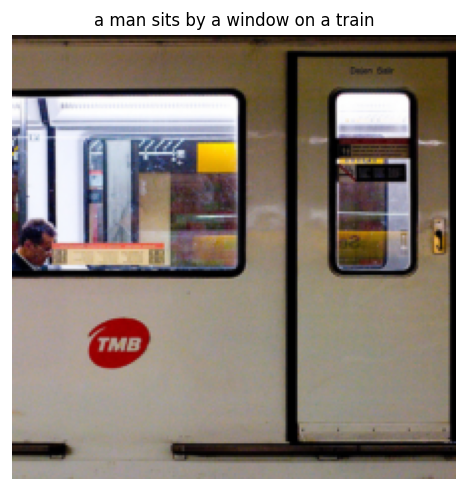

Saved results/prediction_1.png


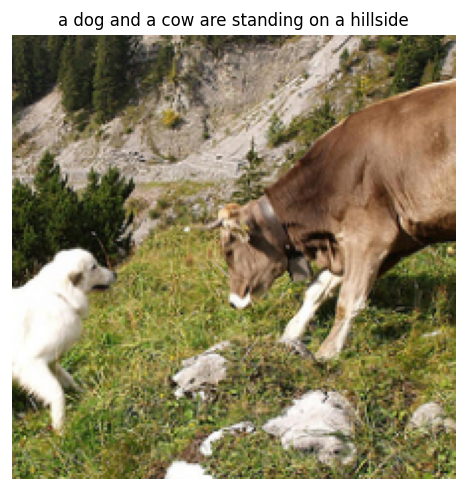

Saved results/prediction_2.png


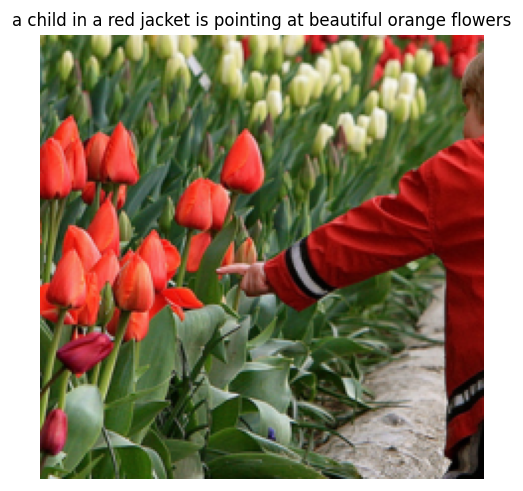

Saved results/prediction_3.png


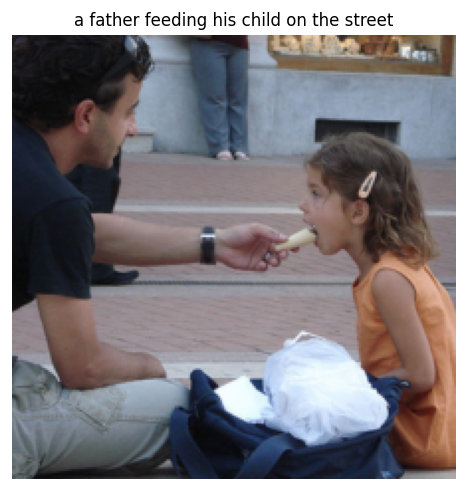

Saved results/prediction_4.png


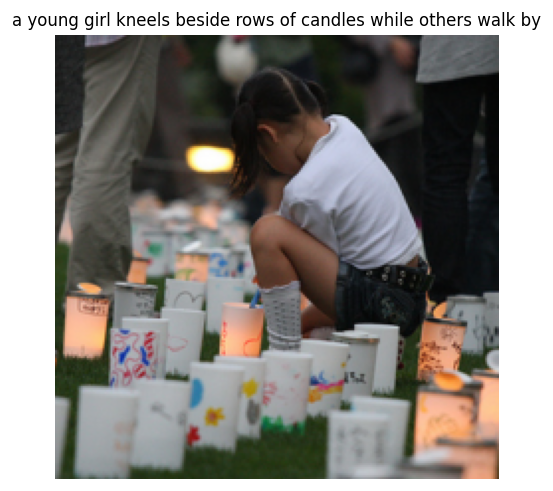

Saved results/prediction_5.png


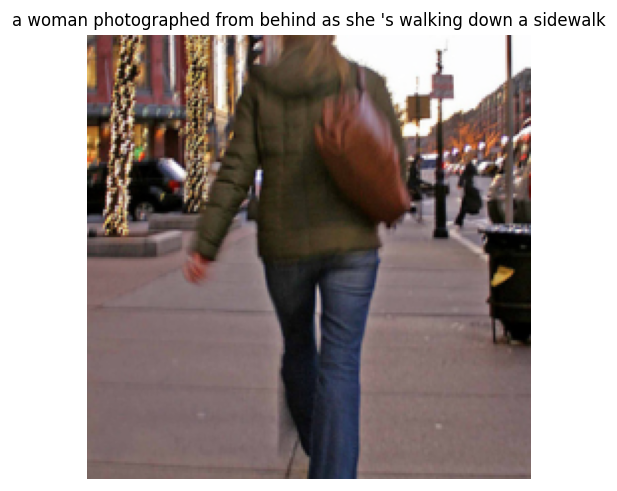

Saved results/prediction_6.png


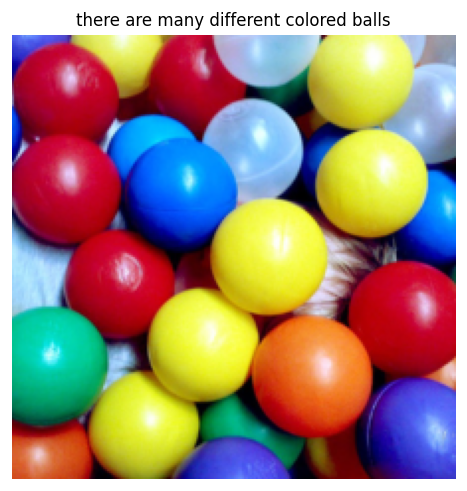

Saved results/prediction_7.png


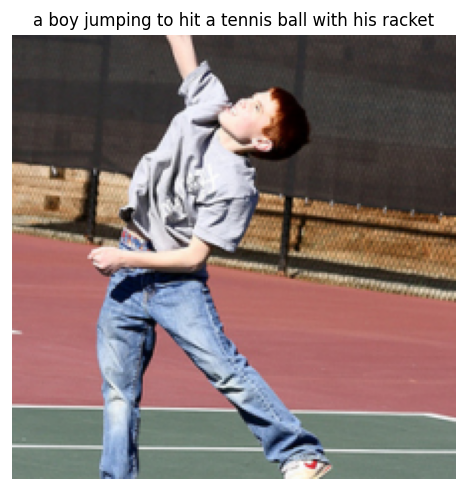

Saved results/prediction_8.png


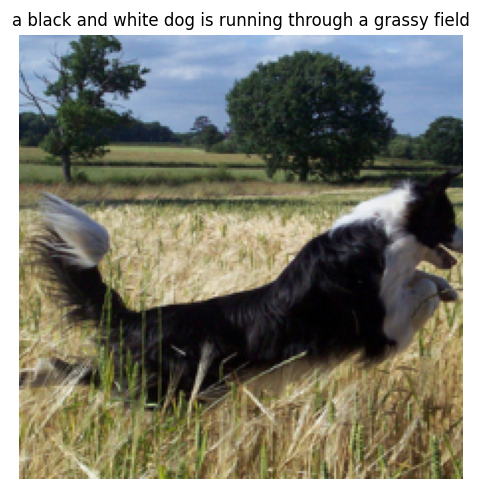

Saved results/prediction_9.png


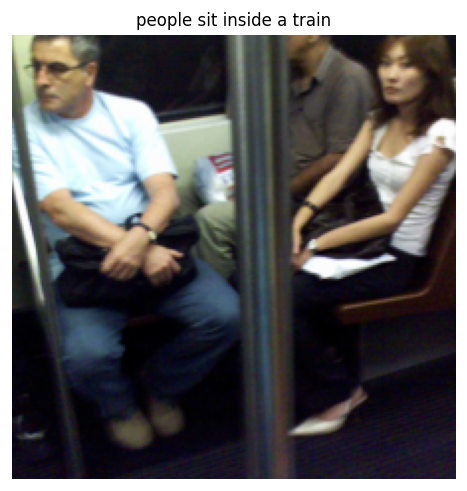

Saved results/prediction_10.png


In [17]:
train_and_validate(cfg)
enc, dec, vocab, _ = load_checkpoint(cfg.checkpoint)
show_random_predictions(enc, dec, vocab, cfg, 10)

Vocab size: 1971
✔ Saved results/prediction_1.png


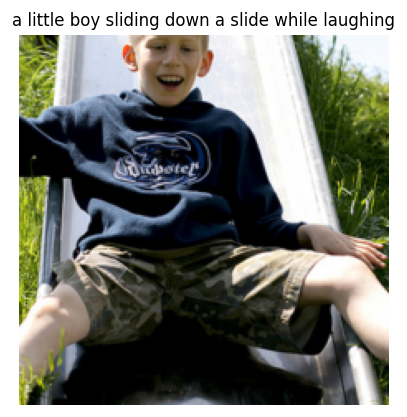

✔ Saved results/prediction_2.png


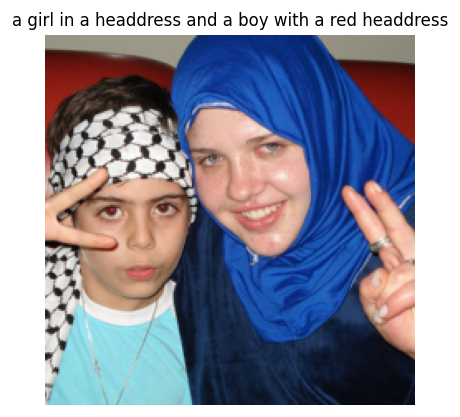

✔ Saved results/prediction_3.png


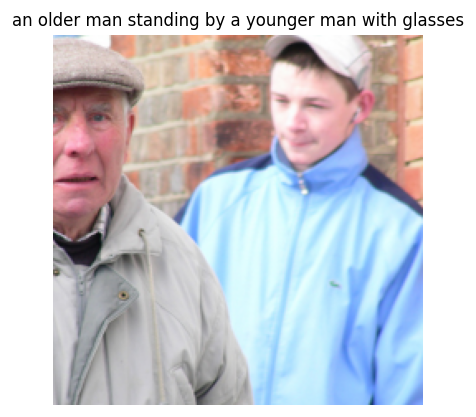

✔ Saved results/prediction_4.png


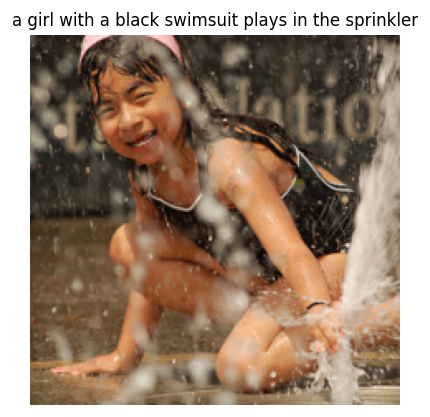

✔ Saved results/prediction_5.png


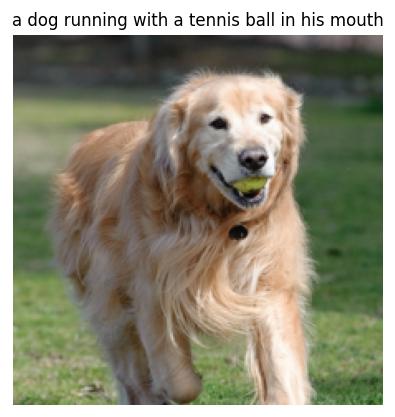

✔ Saved results/prediction_6.png


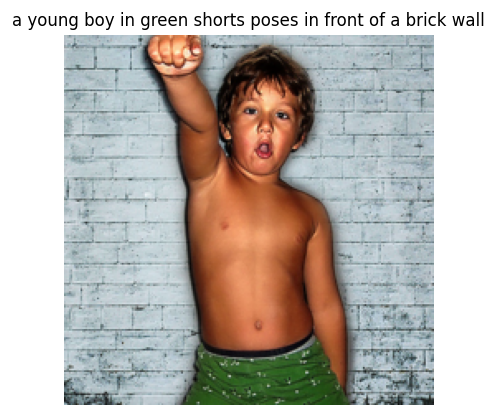

✔ Saved results/prediction_7.png


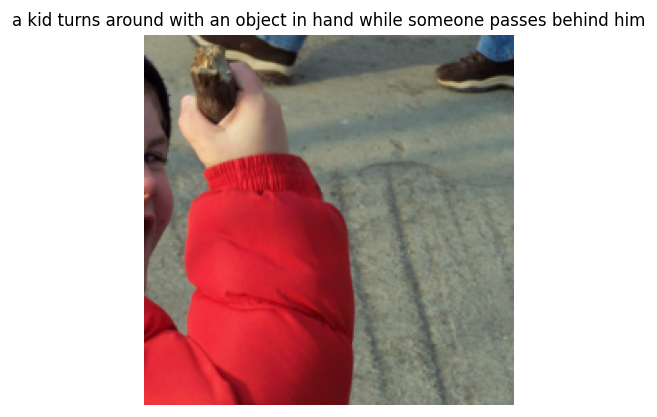

✔ Saved results/prediction_8.png


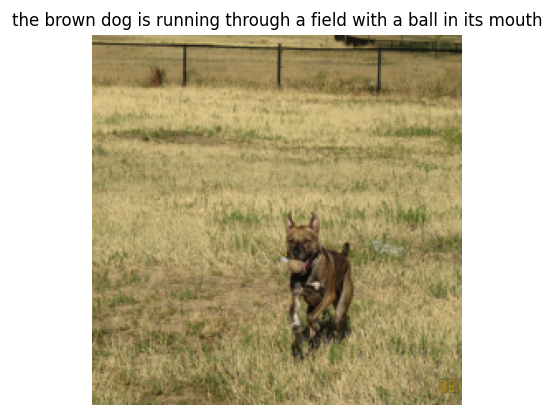

✔ Saved results/prediction_9.png


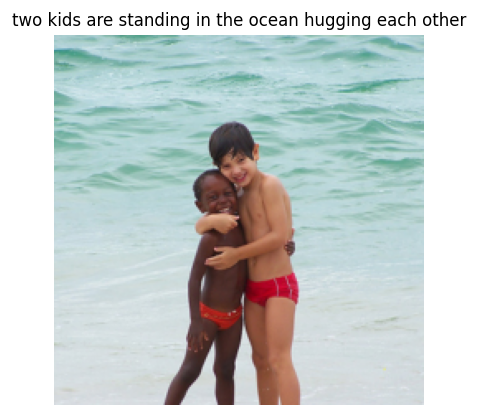

✔ Saved results/prediction_10.png


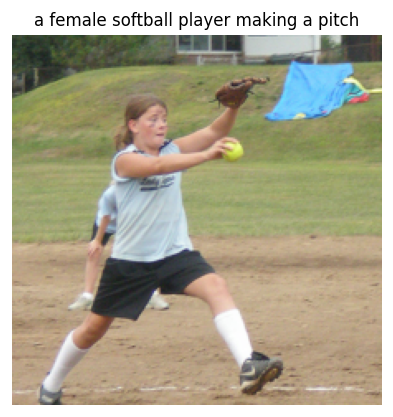

✔ Saved results/prediction_11.png


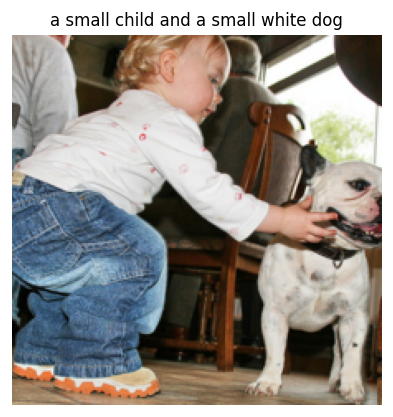

✔ Saved results/prediction_12.png


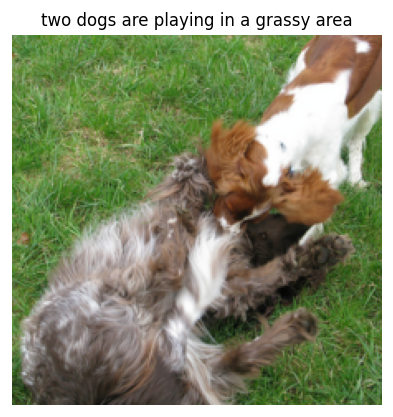

✔ Saved results/prediction_13.png


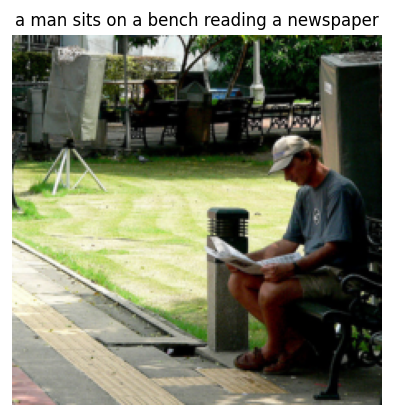

✔ Saved results/prediction_14.png


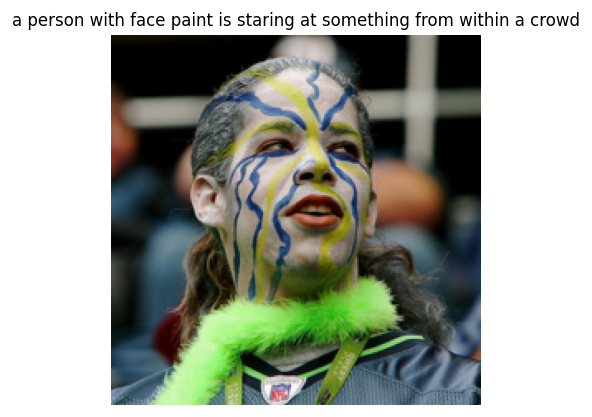

✔ Saved results/prediction_15.png


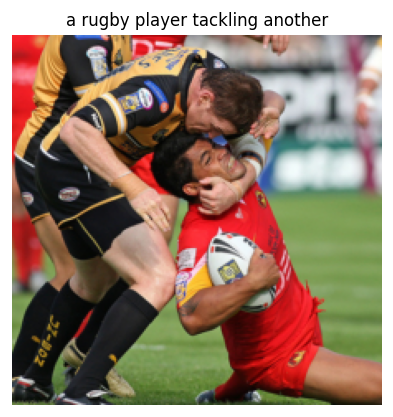

✔ Saved results/prediction_16.png


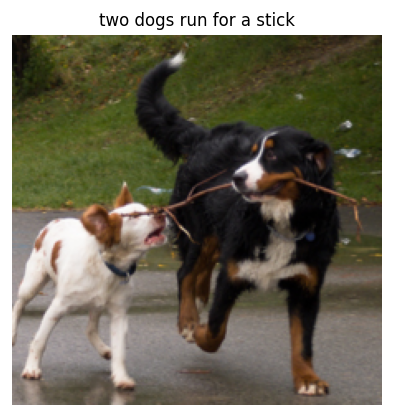

✔ Saved results/prediction_17.png


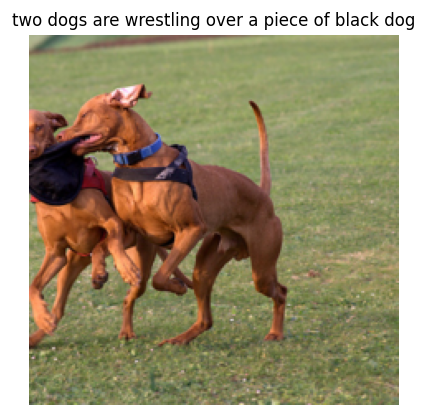

✔ Saved results/prediction_18.png


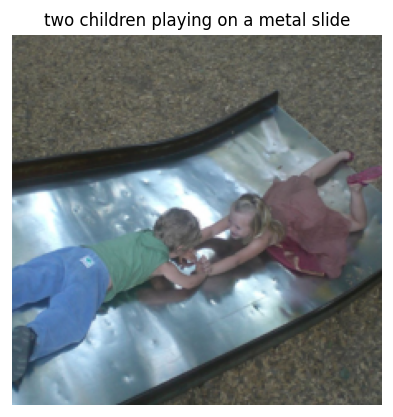

✔ Saved results/prediction_19.png


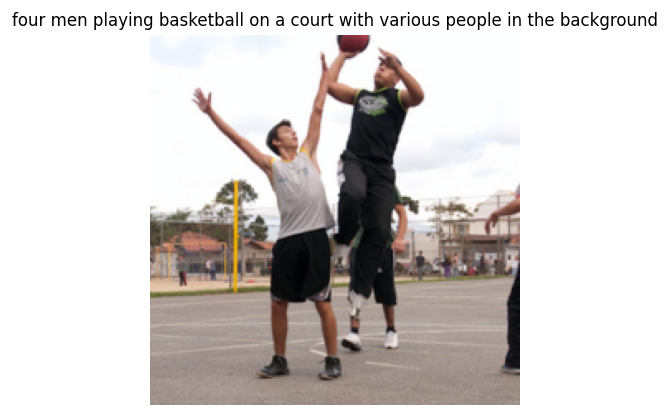

✔ Saved results/prediction_20.png


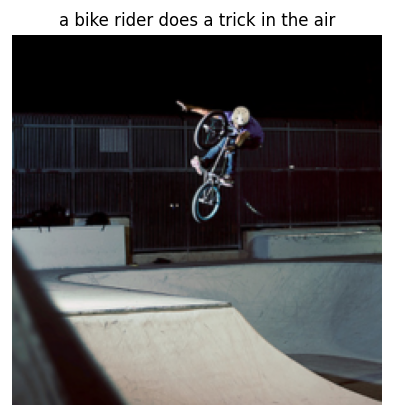

✔ Saved results/prediction_21.png


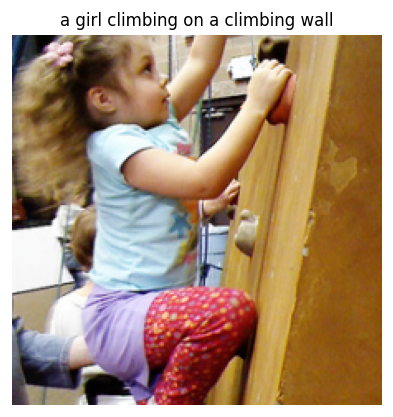

✔ Saved results/prediction_22.png


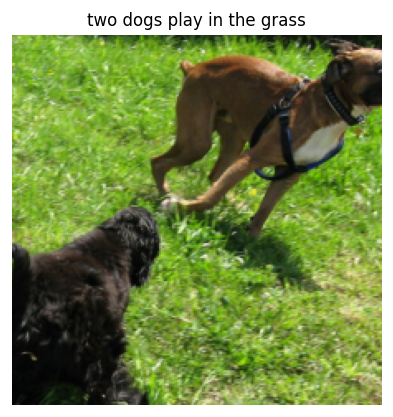

✔ Saved results/prediction_23.png


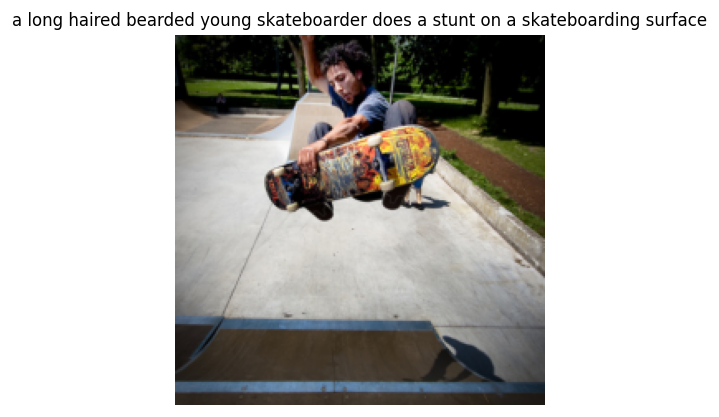

✔ Saved results/prediction_24.png


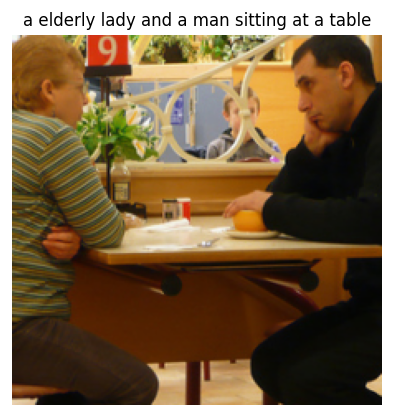

✔ Saved results/prediction_25.png


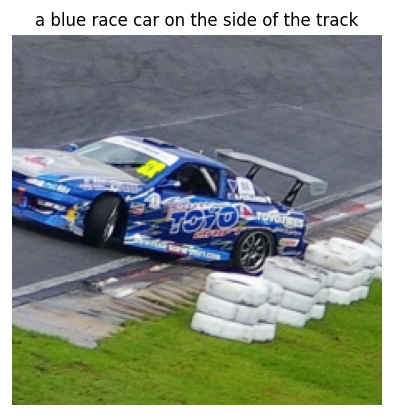

✔ Saved results/prediction_26.png


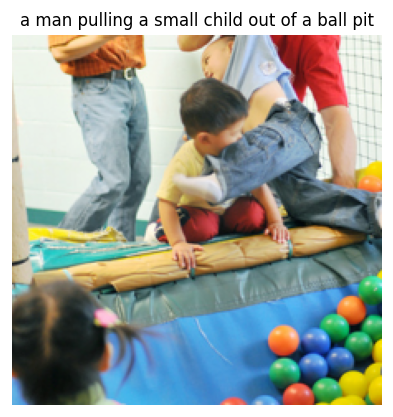

✔ Saved results/prediction_27.png


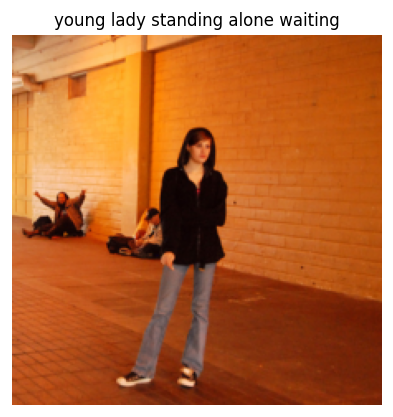

✔ Saved results/prediction_28.png


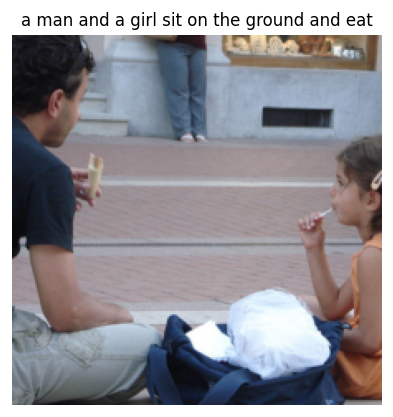

✔ Saved results/prediction_29.png


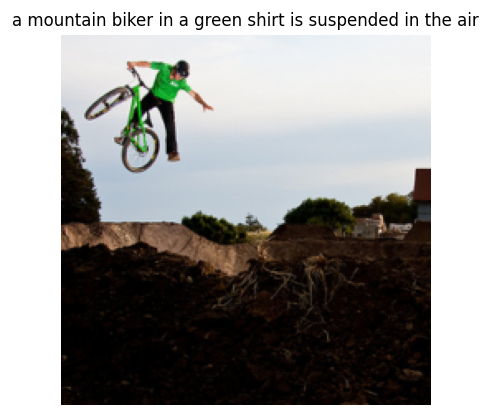

✔ Saved results/prediction_30.png


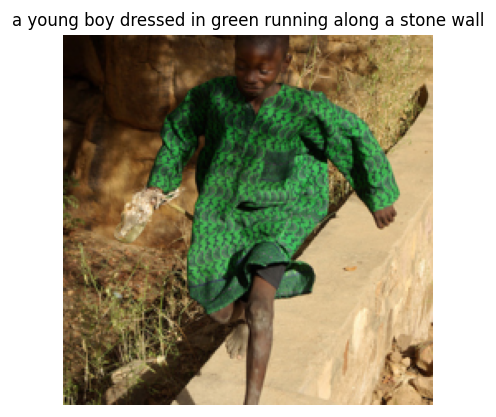

✔ Saved results/prediction_31.png


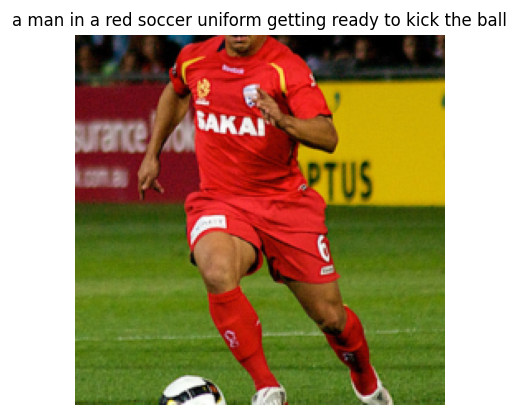

✔ Saved results/prediction_32.png


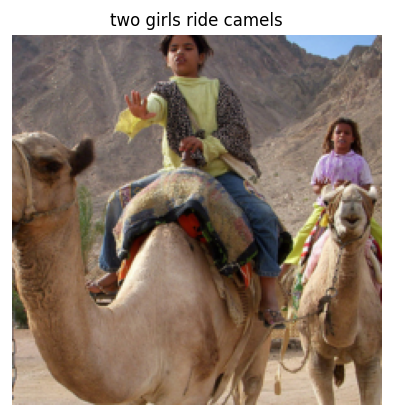

✔ Saved results/prediction_33.png


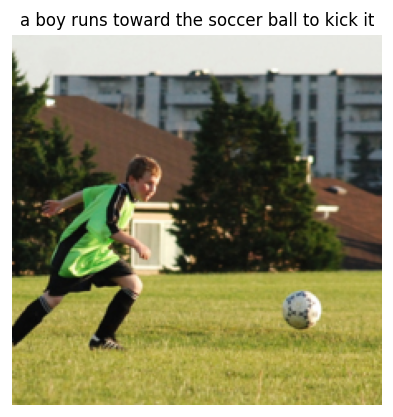

✔ Saved results/prediction_34.png


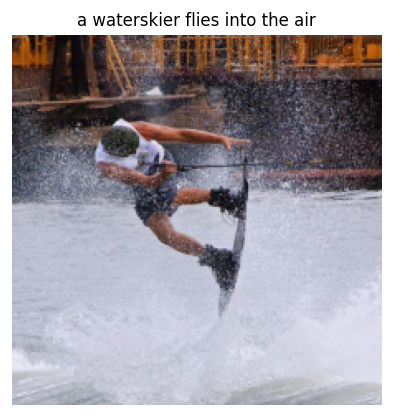

✔ Saved results/prediction_35.png


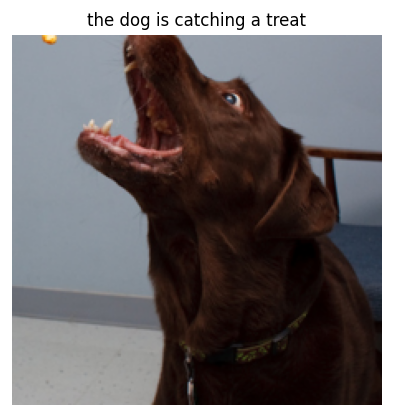

✔ Saved results/prediction_36.png


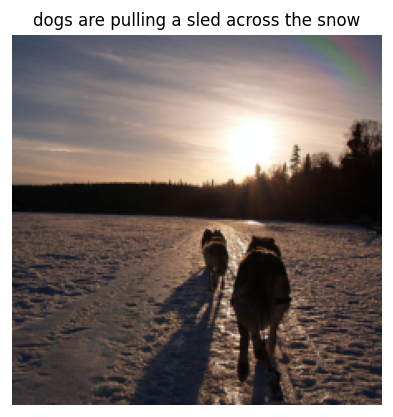

✔ Saved results/prediction_37.png


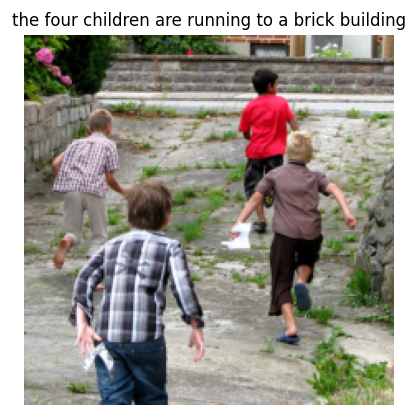

✔ Saved results/prediction_38.png


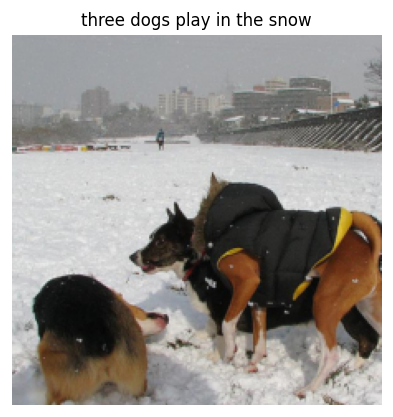

✔ Saved results/prediction_39.png


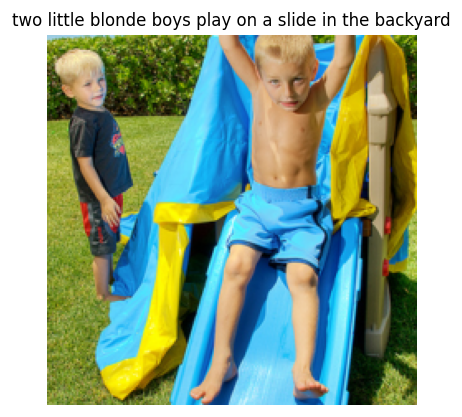

✔ Saved results/prediction_40.png


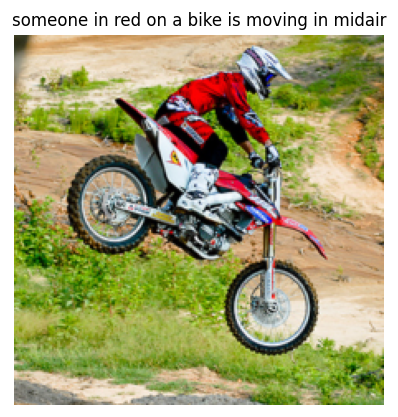

✔ Saved results/prediction_41.png


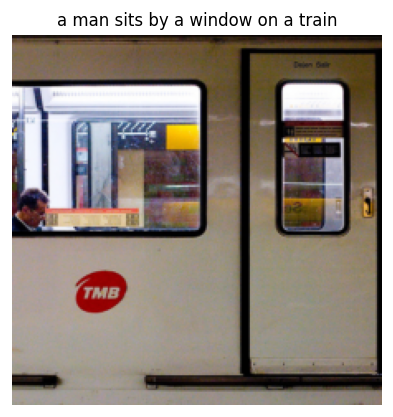

✔ Saved results/prediction_42.png


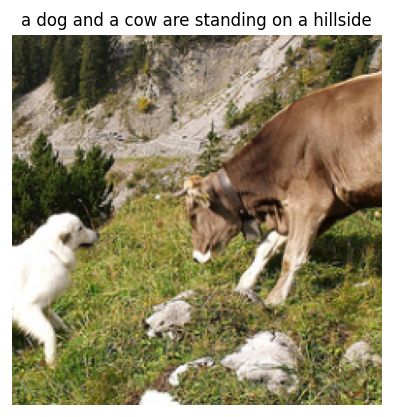

✔ Saved results/prediction_43.png


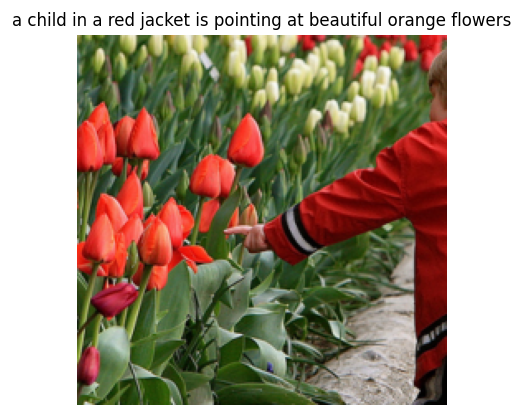

✔ Saved results/prediction_44.png


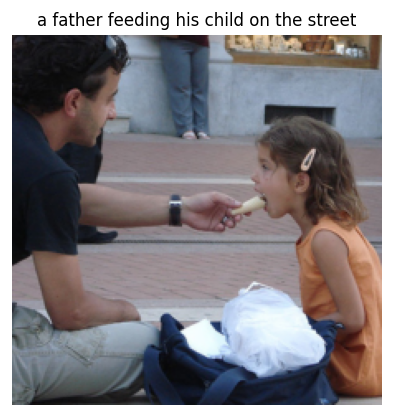

✔ Saved results/prediction_45.png


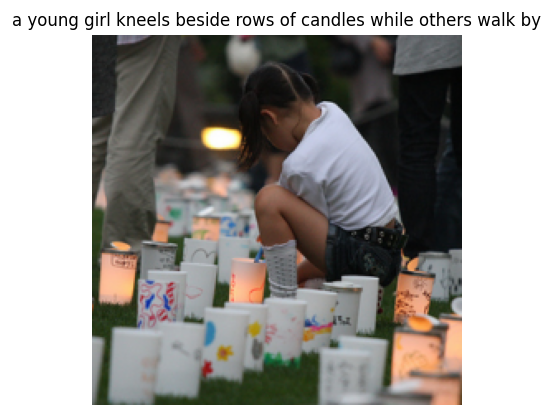

✔ Saved results/prediction_46.png


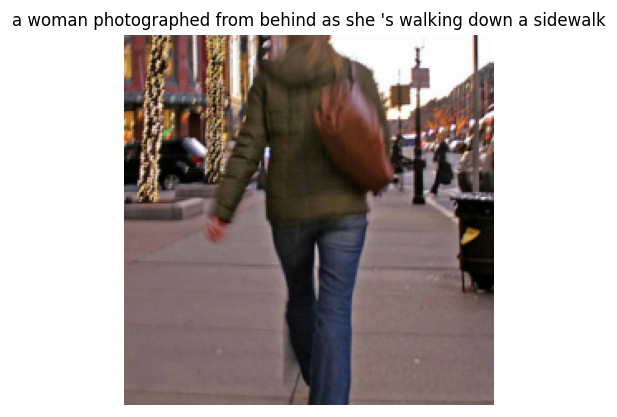

✔ Saved results/prediction_47.png


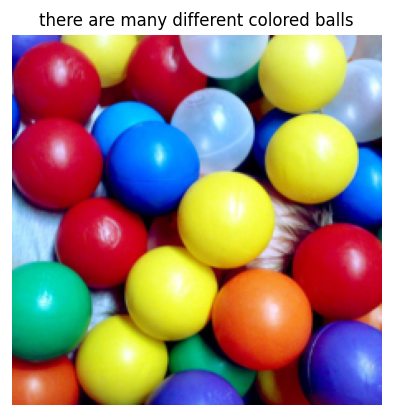

✔ Saved results/prediction_48.png


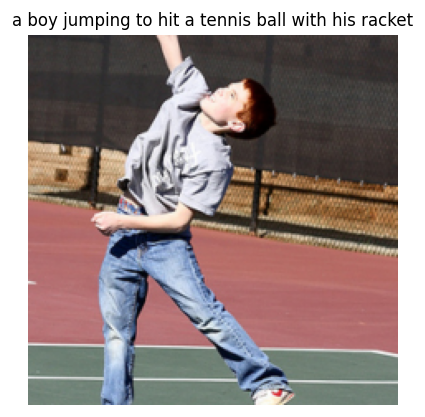

✔ Saved results/prediction_49.png


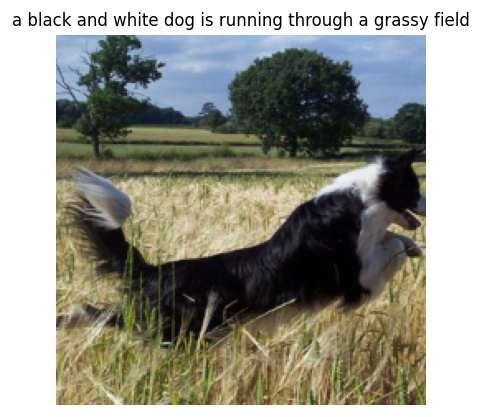

✔ Saved results/prediction_50.png


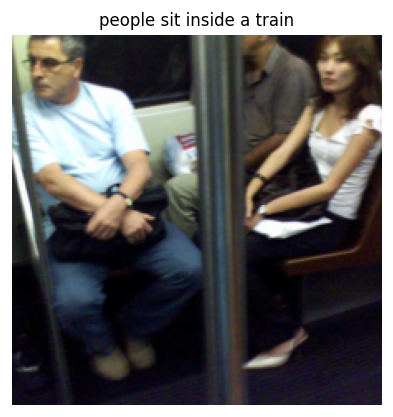

In [26]:
enc, dec, vocab, _ = load_checkpoint(cfg.checkpoint)
show_random_predictions(enc, dec, vocab, cfg, 50)